# API for figure

In [1]:
%load_ext autoreload
%matplotlib inline
from TreeMazeAnalyses2.Analyses import experiment_info as ei
from importlib import reload

In [2]:
%%time
ei = reload(ei)
summary = ei.SummaryInfo()
summary.update_paths()

CPU times: user 250 ms, sys: 16 ms, total: 266 ms
Wall time: 269 ms


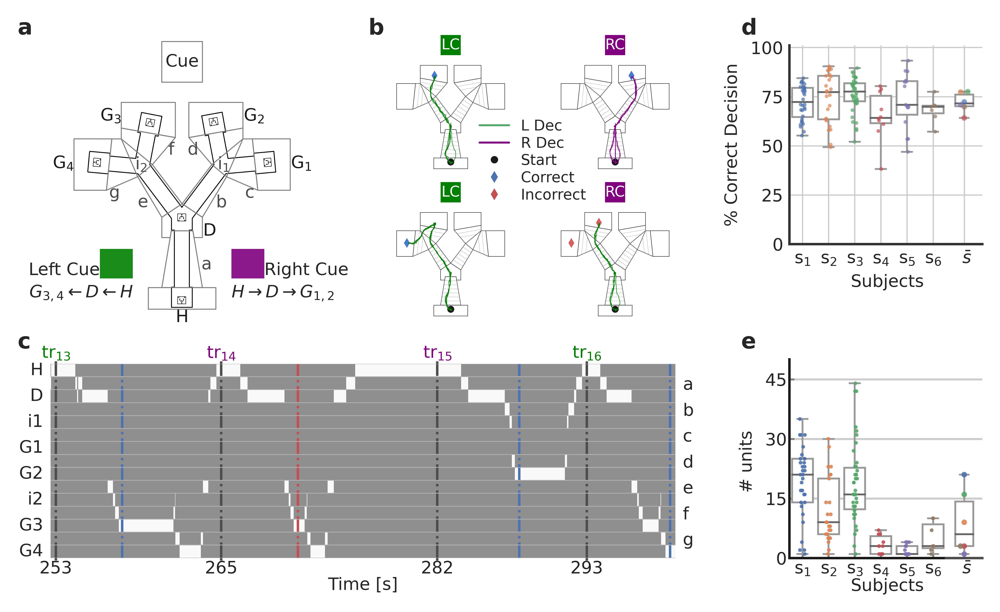

In [4]:
%autoreload 2
ei = reload(ei)
summary = ei.SummaryInfo()
_=summary.plot(fig_id=1,save=False, root_dir='GD', dpi=2000, fig_format='pdf')

Direct Implementation on plot functions

In [23]:
6.5/1.7

/home/alexgonzalez/anaconda3/envs/spk_phy2/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


3.823529411764706

In [5]:
import Analyses.plot_functions as pf

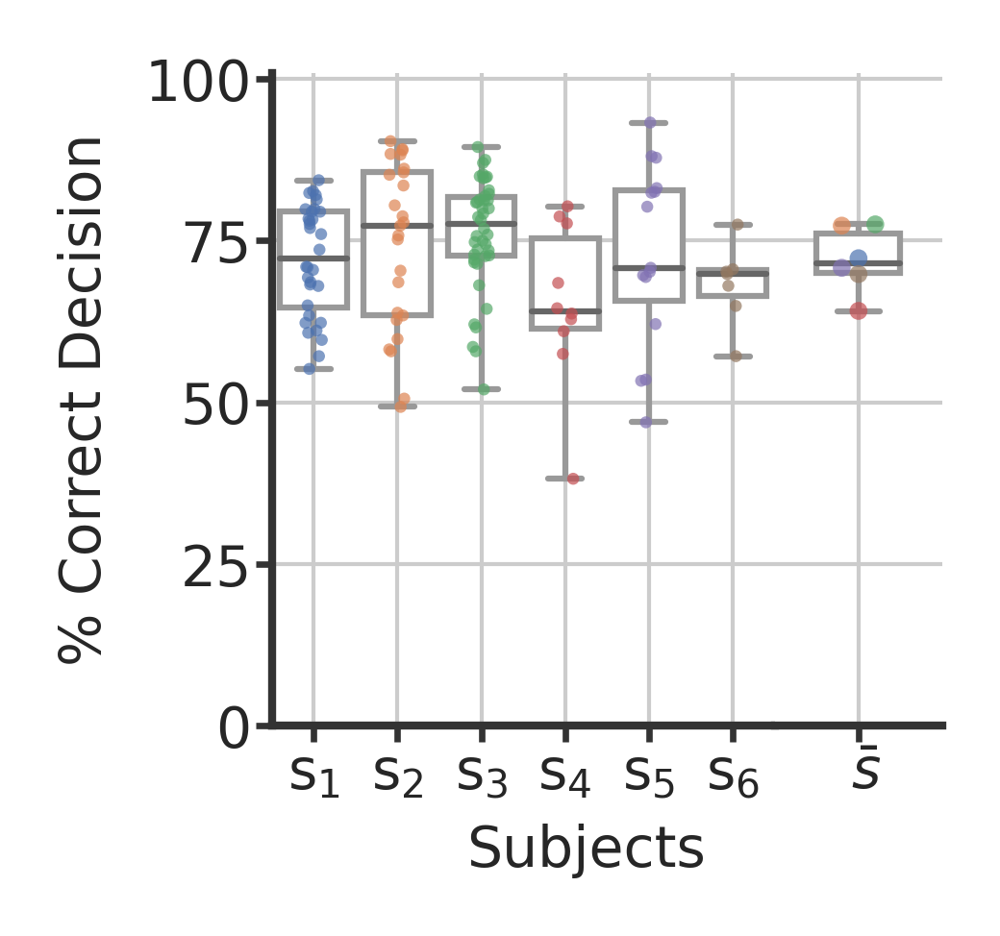

In [16]:
pf=reload(pf)
f=pf.Fig1().panel_d()

In [15]:
f.savefig("/home/alexgonzalez/Documents/treemazefigs/fig1/panel_e.png", dpi=600,  bbox_inches='tight')

In [8]:
pf = reload(pf)
f1 = pf.Fig1()

In [16]:
subjects = f1.summary_info.subjects
perf = f1.summary_info.get_behav_perf()
subset = perf[
            (perf.n_units >= f1.summary_info.min_n_units) & (perf.n_trials >= f1.summary_info.min_n_trials)]
subset2 = subset.groupby('subject').median()
subset2.loc[subjects, 'n_units']
subset2.median()

/home/alexgonzalez/anaconda3/envs/spk_phy2/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


n_trials           110.250000
n_sw_trials         54.000000
n_vsw_trials        40.000000
n_L_trials          56.500000
n_R_trials          50.000000
pct_correct          0.726064
pct_sw_correct       0.768851
pct_vsw_correct      0.812937
pct_L_correct        0.767123
pct_R_correct        0.678393
n_units              7.250000
n_cells              1.000000
n_mua                6.000000
dtype: float64

In [19]:
f1.

/home/alexgonzalez/anaconda3/envs/spk_phy2/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Below the development

In [4]:
%matplotlib inline
from importlib import reload
from pathlib import Path
from scipy import signal, stats, spatial, ndimage

import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 20)

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import seaborn as sns
sns.set(style='whitegrid', palette='muted')

from TreeMazeAnalyses2.Analyses import spatial_functions as spatial_funcs
import TreeMazeAnalyses2.Analyses.open_field_functions as of_funcs
import TreeMazeAnalyses2.Analyses.tree_maze_functions as tmf

from TreeMazeAnalyses2.Analyses import subject_info as si
si = reload(si)

from ipywidgets import interact, fixed
import ipywidgets as widgets

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

In [6]:
from TreeMazeAnalyses2.Analyses import subject_info as si

si = reload(si)
session = 'Li_T3g_070618'
subject = session.split('_')[0]
session_info = si.SubjectSessionInfo(subject, session)

In [7]:
behav = session_info.get_event_behavior(overwrite=True)
behav.trial_table.head()

,t0,tE,dur,cue,dec,correct,long,goal,sw,vsw
0,101,523,422,L,L,1,1,4,0,0
1,890,1332,441,R,L,0,-1,-1,1,1
2,1855,2361,506,L,R,0,-1,-1,1,0
3,2824,3539,714,R,L,0,-1,-1,1,0
4,3759,4434,674,L,L,1,1,4,1,0


In [8]:
track_data, nan_idx = session_info.get_track_data(overwrite=False)
track_data.head()

,t,x,y,ha
0,489.949,190.368533,850.551084,2.234021
1,489.969,176.504035,828.124600,1.815142
2,489.989,171.462017,827.906691,1.815142
3,490.009,162.134914,814.407219,1.431170
4,490.029,131.380287,778.154401,1.692969


## Test API for treemaze figure

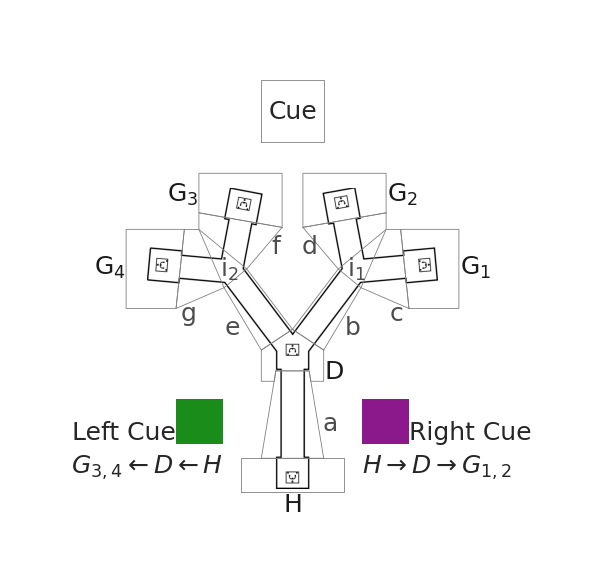

In [167]:
tmf = reload(tmf)
tree_maze = tmf.TreeMazeZones()
f,ax = tree_maze.fig1_layout(**{'seg_alpha':0})
#f.savefig(fig_path / 'segmented_maze.jpeg', bbox_inches='tight', dpi=dpi)

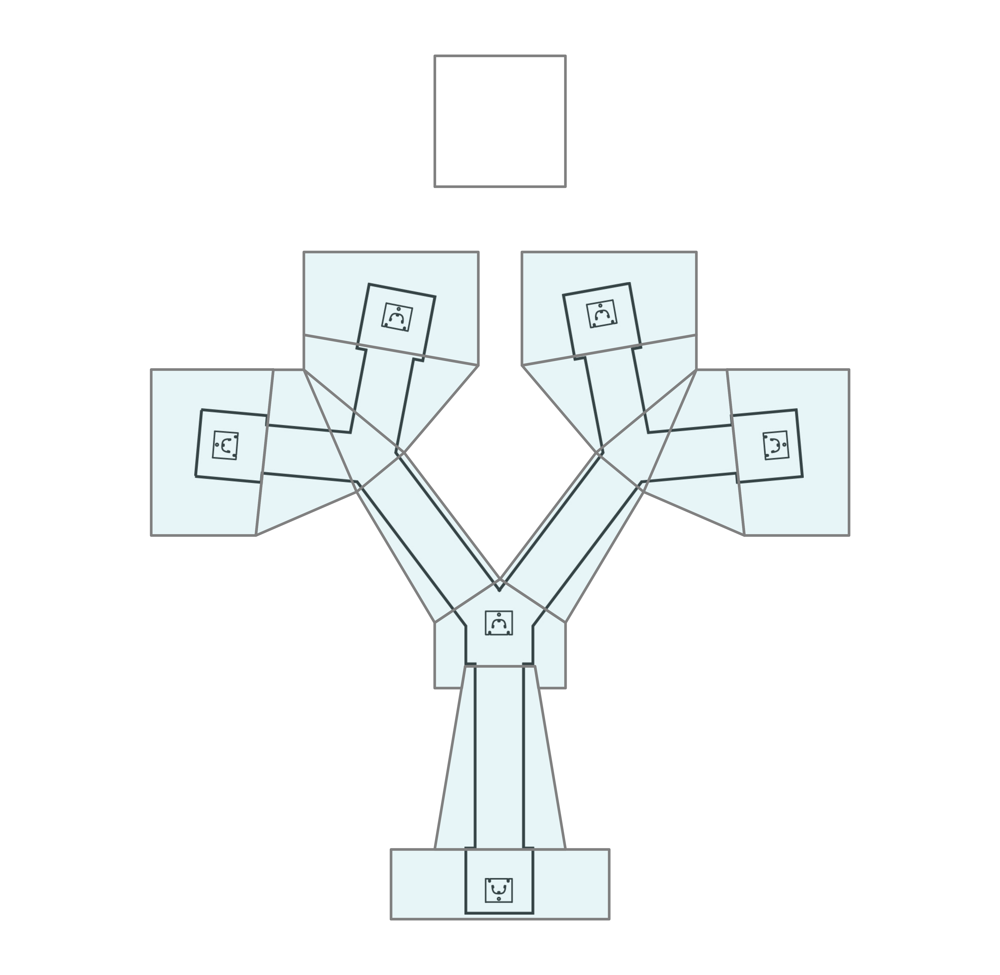

In [155]:
tmf = reload(tmf)
tree_maze = tmf.TreeMazeZones()
ax = tree_maze.plot_maze(tm_layout=True, plot_cue=True)

In [153]:
ax.get_position().height

0.755

In [150]:
0.125+0.038, 0.125/0.164

(0.163, 0.7621951219512195)

## plot example trials

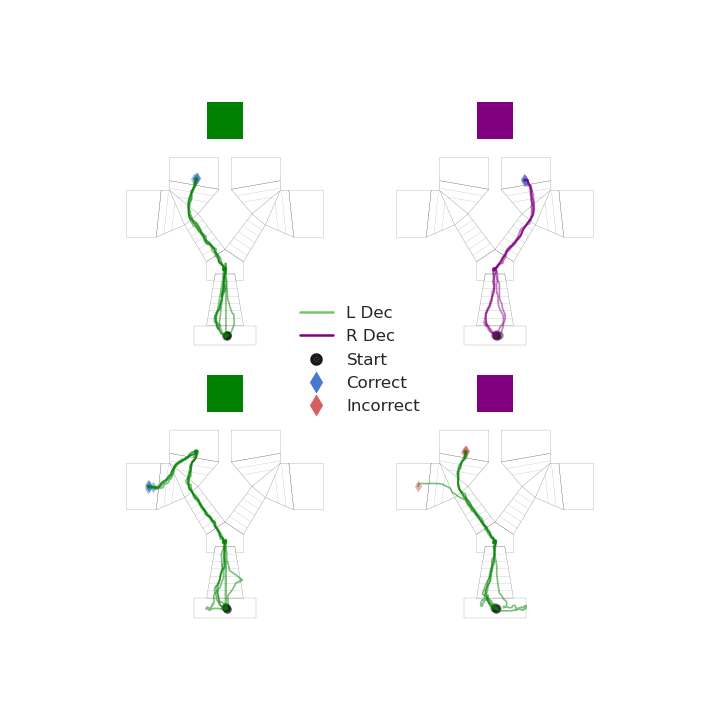

In [273]:
tmf = reload(tmf)
tree_maze = tmf.TreeMazeZones()

f, ax = plt.subplots(2,2, figsize=(1,1),dpi=600)

np.random.seed(1)
cue = np.array([['L', 'R'], ['L', 'R']])
dec = np.array([['L', 'R'], ['L', 'L']])
long_trial = np.array([[0,0],[1,-1]])


n_plot_trials = 5
max_dur = 700
lw=0.2
line_alpha=0.5
marker_alpha = 0.75

for row in range(2):
    for col in range(2):
        dec_full = 'left' if dec[row,col]=='L' else 'right'
        
        _ = tree_maze.plot_maze(seg_color=None, zone_labels=False, seg_alpha=0.1, font_size=5, lw=0.03, sub_seg_lw=0.01,
                                sub_seg_color='None', axis=ax[row,col], plot_cue=True, cue_color= cue[row,col], sub_segs='all')
        
        sub_table = behav.trial_table[ (behav.trial_table.dec==dec[row, col]) & (behav.trial_table.cue==cue[row, col]) &
                                      (behav.trial_table.dur<=max_dur) & (behav.trial_table.long==long_trial[row, col]) ]
        
        sel_trials = np.random.choice(sub_table.index, n_plot_trials, replace=False)
        
        marker_end_color = 'b' if dec[row,col]==cue[row,col] else 'r'
        for trial in sel_trials:
            t0 = sub_table.loc[trial, 't0']
            tE = sub_table.loc[trial, 'tE']
            ax[row,col].plot(track_data.loc[t0:tE, 'x'], track_data.loc[t0:tE, 'y'], 
                           color=tree_maze.split_colors[dec_full], lw=lw, alpha=line_alpha )    
            ax[row,col].scatter(track_data.loc[t0, 'x'],track_data.loc[t0, 'y'], s=1, 
                                marker='o', lw=0, alpha=marker_alpha, color='k')
            ax[row,col].scatter(track_data.loc[tE, 'x'],track_data.loc[tE, 'y'], s=1, 
                                marker='d', lw=0, alpha=marker_alpha, color=marker_end_color)

            
plt.subplots_adjust(hspace=0.02, wspace=0, left=0.05, right=0.95, top=0.95, bottom=0.05)

legend_elements = [Line2D([0], [0], color='g', lw=0.3, label='L Dec'),
                   Line2D([0], [0], color='purple', lw=0.3, label='R Dec'),
                   Line2D([0], [0], marker='o', color='k', lw=0, label='Start',
                          markerfacecolor='k', markersize=0.5),
                   Line2D([0], [0], marker='d', color='b', lw=0, label='Correct',
                          markerfacecolor='b', markersize=0.5),
                   Line2D([0], [0], marker='d', color='r', lw=0, label='Incorrect',
                          markerfacecolor='r', markersize=0.5)]

l_ax = f.add_axes([0,0,1,1])
l_ax.legend(handles=legend_elements, loc='center', fontsize=2, frameon=False)
l_ax.axis("off")

f.savefig(fig_path / 'example_trials.jpeg', bbox_inches='tight', dpi=dpi)

# plot behavior

In [10]:
summary_data_path_gd =  Path("/home/alexgonzalez/google-drive/TreeMazeProject/Results_Summary/")
fn = 'behavior_session_perf.csv'

perf = pd.read_csv(summary_data_path_gd/fn, index_col=0)

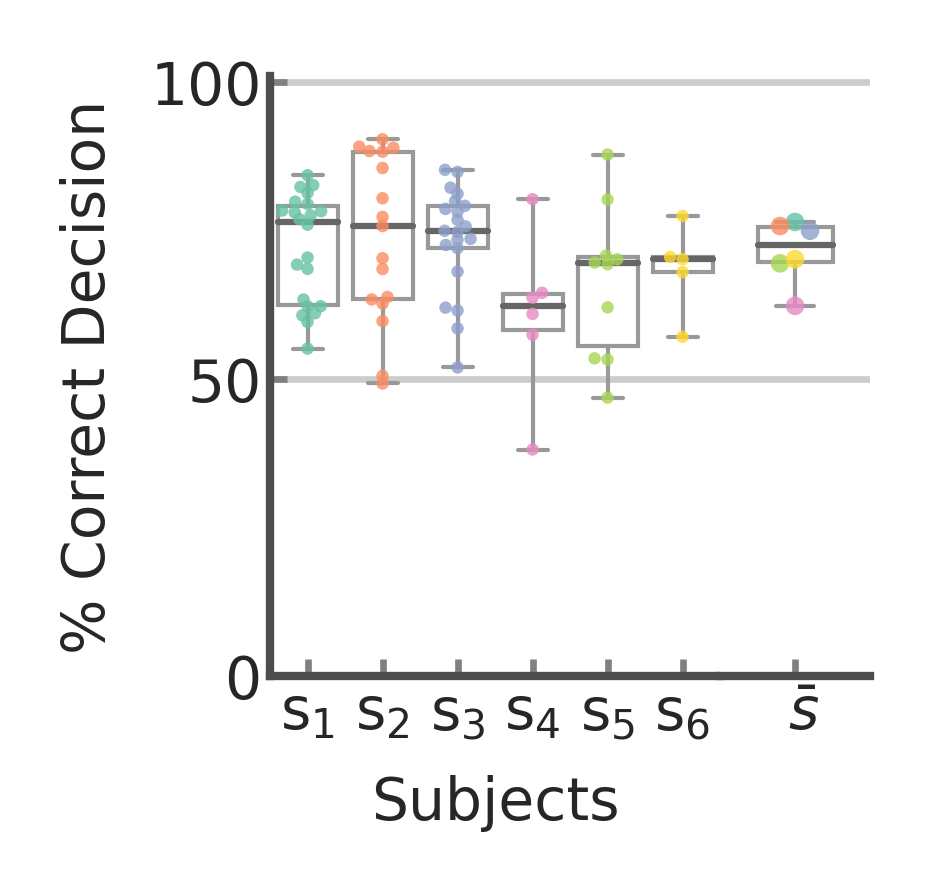

In [56]:
min_n_units = 1
min_n_trials = 50
fontsize=7

subset = perf[(perf.n_units>=min_n_units) & (perf.n_trials>=min_n_trials)]
subjects = subset.subject.unique()

f,ax = plt.subplots(figsize=(1,1), dpi=600)

x_split = 0.75
ax.set_position([0,0,x_split,1])

sns.set_theme(context='paper', style="whitegrid", font_scale=0.75, palette="Set2")
sns.set_style(rc={"axes.edgecolor":'0.3',
                 'xtick.bottom': True,
                 'ytick.left': True})

sns.boxplot(x='subject', y='pct_correct', data=subset, color='w', linewidth=0.5, whis=100,  ax=ax)
sns.swarmplot(x='subject', y='pct_correct',data=subset, size=1.5, ax=ax, **{'alpha':0.8}) 

for line in ax.get_lines()[4::len(subjects)]:
    line.set(**{'color':'0.4', 
               'lw':0.75})
    
ax.set_ylim(0,1.01)
ax.set_yticks([0,0.5,1])
ax.set_yticklabels([0, 50, 100], fontsize=fontsize)
ax.set_ylabel('% Correct Decision',fontsize=fontsize)

ax.set_xticklabels([f"s$_{{{ii}}}$" for ii in range(1,len(subjects)+1)], fontsize=fontsize)
ax.set_xlabel('Subjects',fontsize=fontsize)

for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)

ax.tick_params(axis="both", direction="in", length=2, width=0.8, color="0.5",  which='major', pad=1)


# summary
ax = f.add_axes([x_split,0,1-x_split,1])

subset2 = subset.groupby('subject').median()

colors =  plt.rcParams['axes.prop_cycle'].by_key()['color']
subset2['color'] = 0

for ii, s in enumerate(subjects):
    subset2.loc[s, 'color'] = mpl.colors.to_hex(colors[ii])
    

sns.boxplot(y='pct_correct', data=subset2.loc[subjects], color='w', linewidth=0.5, whis=100, width=0.5, ax=ax)

x_locs = np.array([0,-1,1, 0,-1, 0])*0.1
ax.scatter(x_locs, subset2.loc[subjects, 'pct_correct'], s=5,c=subset2.loc[subjects,'color'], alpha=0.8, lw=0, zorder=10) 


for line in ax.get_lines()[4::len(subjects)]:
    line.set(**{'color':'0.4', 
               'lw':0.75})

ax.set_ylim(0,1.01)
ax.set_yticks([0,0.5,1])
ax.set_yticklabels('')
ax.set_ylabel('')

ax.set_xticklabels( [r" $\bar s$ "], fontsize=fontsize)

for spine in ['top', 'right', 'left']:
    ax.spines[spine].set_visible(False)

    
ax.tick_params(axis="both", direction="in", length=2, width=0.8, color="0.5",  which='major', pad=1)
ax.tick_params(axis='y', left=False) 

f.savefig(fig_path / 'behavior.jpeg', bbox_inches='tight', dpi=dpi)

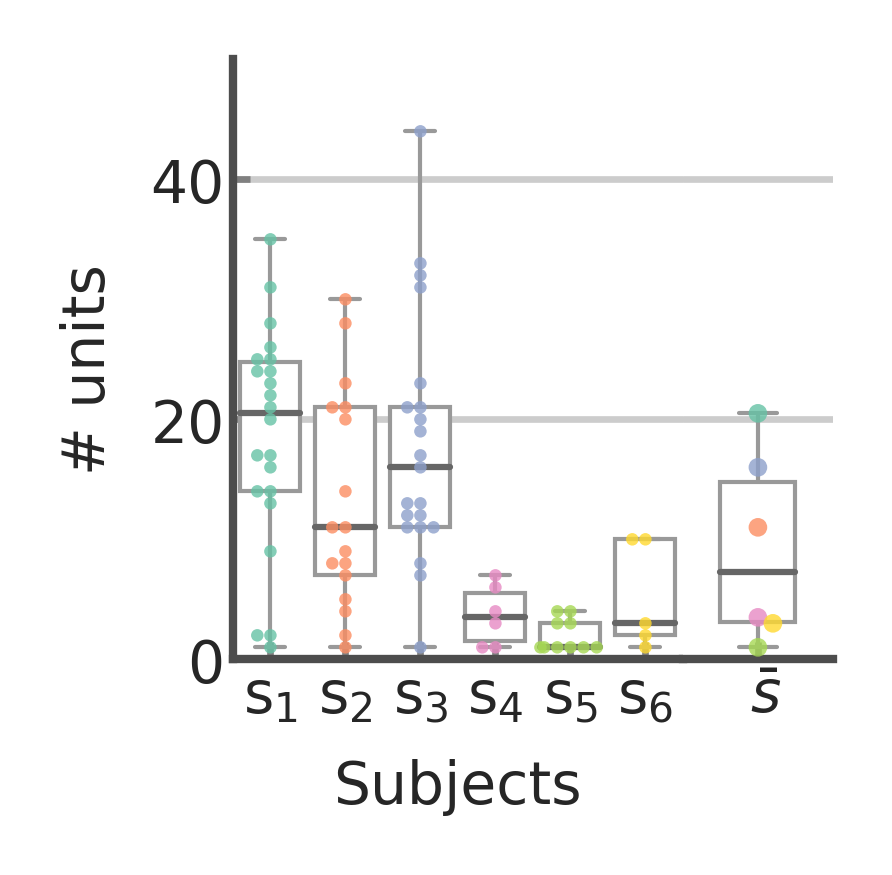

In [67]:
f,ax = plt.subplots(figsize=(1,1), dpi=600)

subset = perf[(perf.n_units>=min_n_units) & (perf.n_trials>=min_n_trials)]

x_split = 0.75
ax.set_position([0,0,x_split,1])

sns.set_theme(context='paper', style="whitegrid", font_scale=0.75, palette="Set2")
sns.set_style(rc={"axes.edgecolor":'0.3',
                 'xtick.bottom': True,
                 'ytick.left': True})

sns.boxplot(x='subject', y='n_units', data=subset, color='w', linewidth=0.5, whis=100,  ax=ax)
sns.swarmplot(x='subject', y='n_units',data=subset, size=1.5, ax=ax, **{'alpha':0.8}) 

for line in ax.get_lines()[4::len(subjects)]:
    line.set(**{'color':'0.4', 
               'lw':0.75})
    
ax.set_ylim(0,50)
ax.set_yticks([0,20,40])
ax.set_yticklabels([0, 20, 40], fontsize=fontsize)
ax.set_ylabel('# units ',fontsize=fontsize)

ax.set_xticklabels([f"s$_{{{ii}}}$" for ii in range(1,len(subjects)+1)], fontsize=fontsize)
ax.set_xlabel('Subjects',fontsize=fontsize)

for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)

ax.tick_params(axis="both", direction="in", length=2, width=0.8, color="0.5",  which='major', pad=1)


# summary
ax = f.add_axes([x_split,0,1-x_split,1])

subset2 = subset.groupby('subject').median()

colors =  plt.rcParams['axes.prop_cycle'].by_key()['color']
subset2['color'] = 0

for ii, s in enumerate(subjects):
    subset2.loc[s, 'color'] = mpl.colors.to_hex(colors[ii])
    

sns.boxplot(y='n_units', data=subset2.loc[subjects], color='w', linewidth=0.5, whis=100, width=0.5, ax=ax)

x_locs = np.array([0,0,0, 0,0, 1])*0.1
ax.scatter(x_locs, subset2.loc[subjects, 'n_units'], s=5,c=subset2.loc[subjects,'color'], alpha=0.8, lw=0, zorder=10) 


for line in ax.get_lines()[4::len(subjects)]:
    line.set(**{'color':'0.4', 
               'lw':0.75})

ax.set_ylim(0,50)
ax.set_yticks([0,20,40])
ax.set_yticklabels('')
ax.set_ylabel('')

ax.set_xticklabels( [r" $\bar s$ "], fontsize=fontsize)

for spine in ['top', 'right', 'left']:
    ax.spines[spine].set_visible(False)

    
ax.tick_params(axis="both", direction="in", length=2, width=0.8, color="0.5",  which='major', pad=1)
ax.tick_params(axis='y', left=False) 
f.savefig(fig_path / 'units.jpeg', bbox_inches='tight', dpi=dpi)

In [190]:
mpl.colors

<module 'matplotlib.colors' from '/home/alexgonzalez/anaconda3/envs/spk_phy2/lib/python3.7/site-packages/matplotlib/colors.py'>

# plot zone behavior time window


In [186]:
tmf = reload(tmf)
tree_maze = tmf.TreeMazeZones()

pos_zones = tree_maze.get_pos_zone_ts(track_data.x, track_data.y)
pos_zones_mat = tree_maze.get_pos_zone_mat(pos_zones)

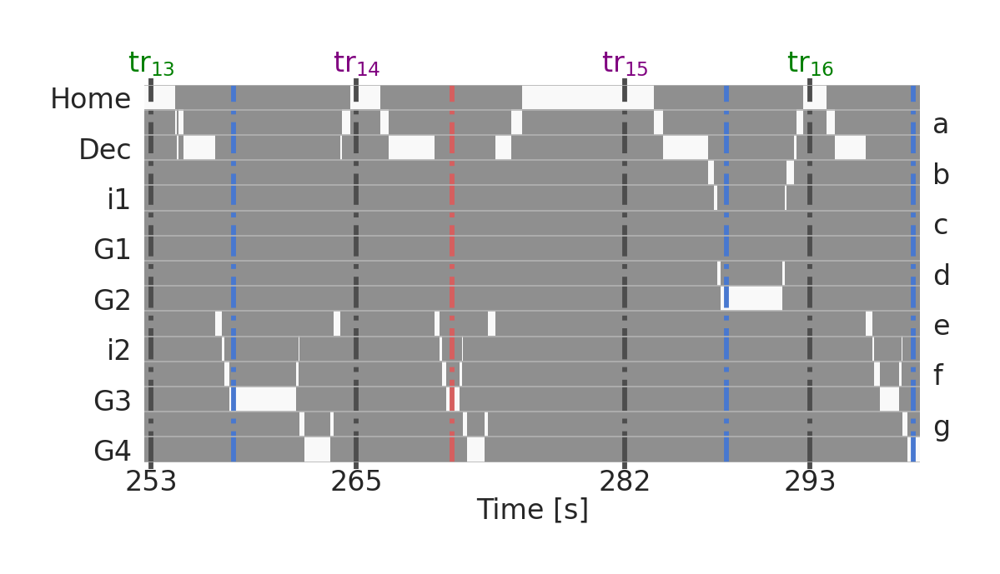

In [405]:
tmf = reload(tmf)
tree_maze = tmf.TreeMazeZones()

trial_nums = np.arange(13,17)

f,ax = plt.subplots(figsize=(2,1), dpi=600)
f, ax = tree_maze.plot_zone_ts_window(pos_zones_mat, trial_table=behav.trial_table, t=track_data.t.values-track_data.t[0], trial_nums=trial_nums, fontsize=4, ax=ax)

#f.savefig(fig_path / 'behav_zone_time_window.jpeg', bbox_inches='tight', dpi=dpi)


In [189]:
pos_zones_mat

AttributeError: 'numpy.ndarray' object has no attribute 'head'

In [79]:
behav.events_ts.shape[0], track_data.shape[0]

(161895, 161895)

In [84]:
sub_table.loc[trial:]

,t0,tE,dur,cue,dec,correct,sw,vsw
151,162530,162794,264,L,L,1,0,0
155,165042,165423,380,L,L,1,1,1
156,165655,166060,404,L,L,1,0,0
158,166961,167272,310,L,L,1,1,1
162,169244,169512,268,L,L,1,1,1
167,173089,173363,274,L,L,1,1,1
174,177992,178351,359,L,L,1,1,1
175,178606,178983,376,L,L,1,0,0
179,181523,181879,355,L,L,1,1,1
181,183007,183384,377,L,L,1,1,1


## Figure Layout

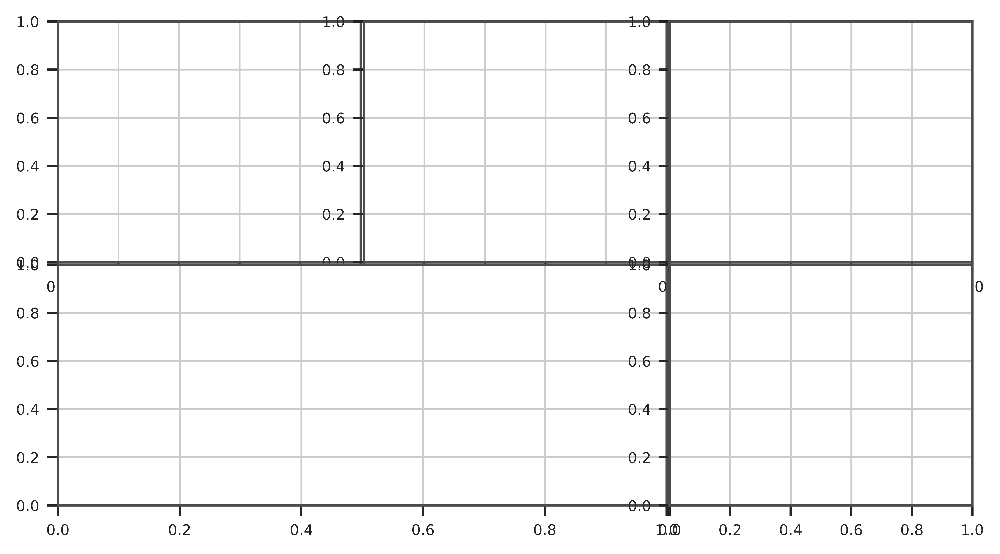

In [171]:
f = plt.figure(constrained_layout=False, figsize=(6,4), dpi=1000)
g = f.add_gridspec(nrows=2, ncols=3, left=0, right=0.95, wspace=0.01, hspace=0.01)

f_ax = np.zeros(5, dtype=object)
f_ax[0] = f.add_subplot(g[0,0])
f_ax[1] = f.add_subplot(g[0,1])
f_ax[2] = f.add_subplot(g[1,0:2])
f_ax[3] = f.add_subplot(g[0,2])
f_ax[4] = f.add_subplot(g[1,2])


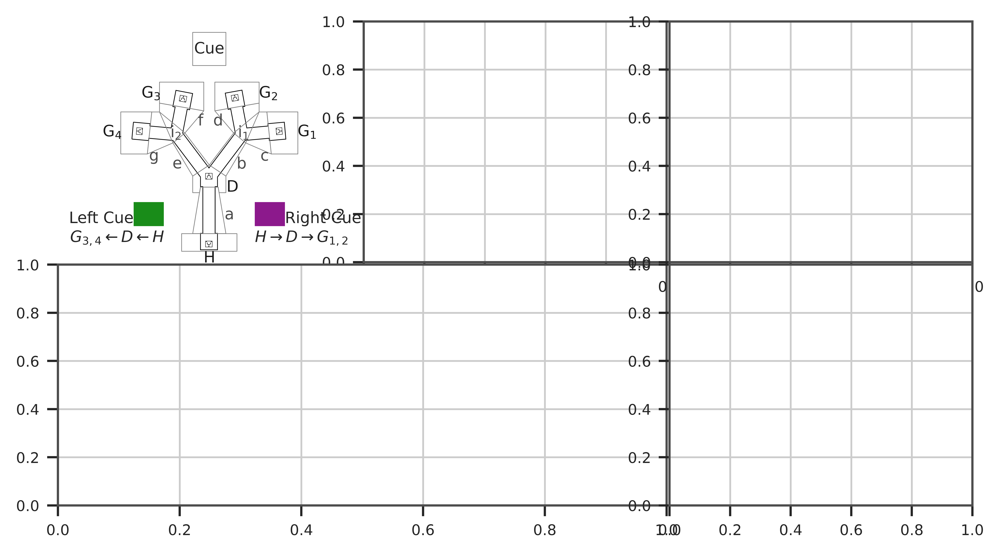

In [172]:
tmf = reload(tmf)
tree_maze = tmf.TreeMazeZones()
f_ax[0].clear()

tree_maze.fig1_layout(ax= f_ax[0], **{'fontsize':7, 'lw':0.3})
f

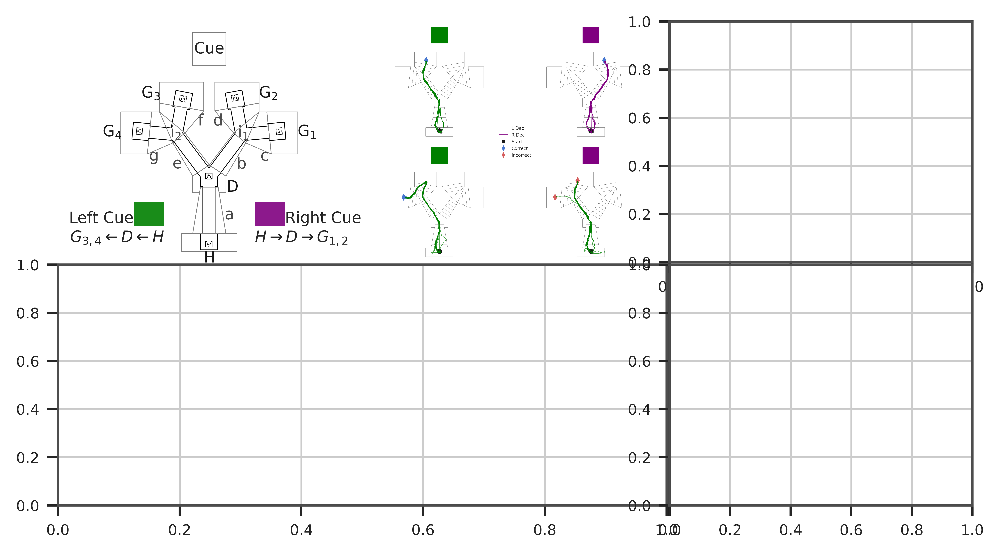

<Figure size 432x288 with 0 Axes>

In [184]:
p = f_ax[1].get_position()
x0=p.x0
y0=p.y0 
w2=p.width/2 
h2=p.height/2

a1 = np.zeros((2,2),dtype=object)
a1[1,0] = f.add_axes([x0,y0,w2,h2])
a1[1,1] = f.add_axes([x0+w2,y0,w2,h2])
a1[0,0] = f.add_axes([x0,y0+h2,w2,h2])
a1[0,1] = f.add_axes([x0+w2,y0+h2,w2,h2])
f_ax[1].axis("off")



np.random.seed(1)
cue = np.array([['L', 'R'], ['L', 'R']])
goal = np.array([[3,2], [4,-1]])
dec = np.array([['L', 'R'], ['L', 'L']])
long_trial = np.array([[0,0],[1,-1]])


n_plot_trials = 5
max_dur = 700
lw=0.2
line_alpha=0.5
marker_alpha = 1
marker_size = 5

H_loc = tree_maze.well_coords['H']
for row in range(2):
    for col in range(2):
        dec_full = 'left' if dec[row,col]=='L' else 'right'
        
        _ = tree_maze.plot_maze(seg_color=None, zone_labels=False, seg_alpha=0.1, fontsize=5, lw=0.03, sub_seg_lw=0.01,
                                sub_seg_color='None', axis=a1[row,col], plot_cue=True, cue_color= cue[row,col], sub_segs='all')
        
        sub_table = behav.trial_table[ (behav.trial_table.dec==dec[row, col]) & 
                                      (behav.trial_table.cue==cue[row, col]) &
                                      (behav.trial_table.dur<=max_dur) & 
                                      (behav.trial_table.long==long_trial[row, col]) &
                                      (behav.trial_table.goal==goal[row, col])
                                     ]
        
        sel_trials = np.random.choice(sub_table.index, n_plot_trials, replace=False)
        
        
        a1[row,col].scatter(H_loc[0],H_loc[1], s=marker_size, marker='o', lw=0, color='k')
        marker_end_color = 'b' if dec[row,col]==cue[row,col] else 'r'
        
        if goal[row,col]>0:
            G_loc = tree_maze.well_coords[f"G{goal[row,col]}"]
            a1[row,col].scatter(G_loc[0],G_loc[1], s=marker_size, marker='d', 
                                lw=0, alpha=marker_alpha, color=marker_end_color)
        else:
            incorrect_wells = tree_maze.split_segs[dec_full]['goals']
                
            for iw in incorrect_wells:
                iw_loc = tree_maze.well_coords[iw]
                a1[row,col].scatter(iw_loc[0],iw_loc[1], s=marker_size, marker='d', 
                                    lw=0, alpha=marker_alpha, color=marker_end_color)
        
        for trial in sel_trials:
            t0 = sub_table.loc[trial, 't0']
            tE = sub_table.loc[trial, 'tE']
            a1[row,col].plot(track_data.loc[t0:tE, 'x'], track_data.loc[t0:tE, 'y'], 
                           color=tree_maze.split_colors[dec_full], lw=lw, alpha=line_alpha )    
        

            
plt.subplots_adjust(hspace=0.02, wspace=0, left=0.05, right=0.95, top=0.95, bottom=0.05)

legend_elements = [Line2D([0], [0], color='g', lw=0.3, label='L Dec'),
                   Line2D([0], [0], color='purple', lw=0.3, label='R Dec'),
                   Line2D([0], [0], marker='o', color='k', lw=0, label='Start',
                          markerfacecolor='k', markersize=0.5),
                   Line2D([0], [0], marker='d', color='b', lw=0, label='Correct',
                          markerfacecolor='b', markersize=0.5),
                   Line2D([0], [0], marker='d', color='r', lw=0, label='Incorrect',
                          markerfacecolor='r', markersize=0.5)]

f_ax[1].legend(handles=legend_elements, loc='center', fontsize=2, frameon=False)

f


# Test plot_functions API for fig 1

In [2]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import Analyses.plot_functions as pf
from importlib import reload
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

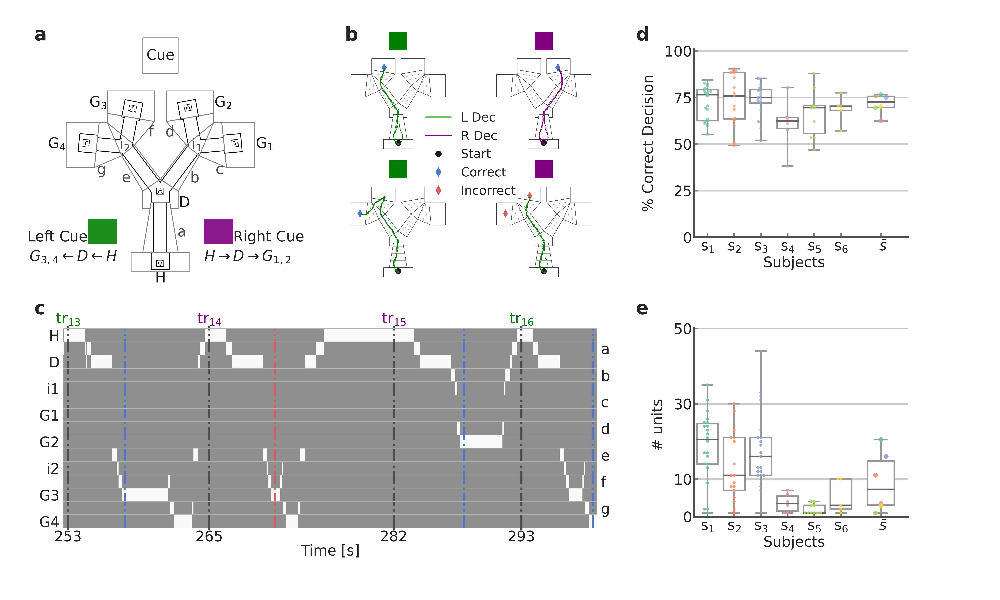

In [38]:
pf = reload(pf)
f = pf.Fig1().plot_all()


In [32]:
0.03*2/3

0.02

In [48]:
p5 = f.get_axes()[5].get_position()
x5, y5, w5, h5 = p5.x0, p5.y0, p5.width, p5.height
print(x5,y5,w5,h5)

0.08001118113930639 0.5385714285714286 0.15373538179316676 0.23944285714285718


In [39]:
x0_mod = -0.001
w_mod = 1
y0_mod = 0.038
h_mod = 0.666
[p0.x0 + x0_mod * p0.width / 0.775,
p0.y0 + y0_mod * p0.height / 0.755,
p0.width * w_mod,
p0.height * h_mod]

[-0.00040589617603076266,
 0.5368211920529802,
 0.31456953642384106,
 0.31079999999999997]

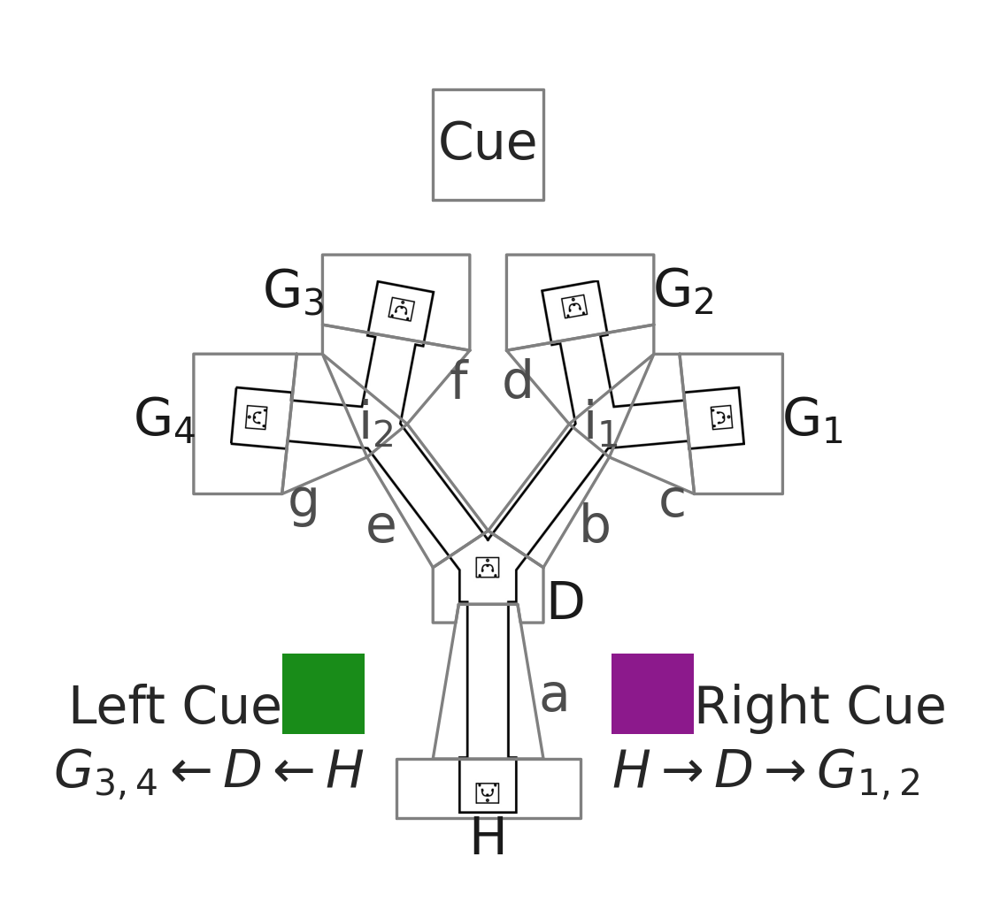

In [49]:
pf = reload(pf)
p = pf.Fig1()
p.panel_a()

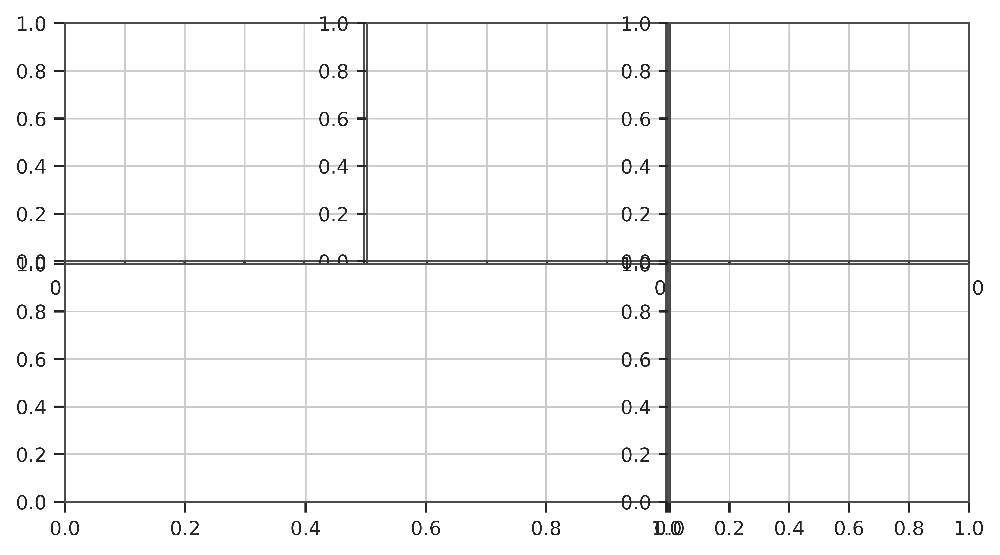

In [54]:
f = plt.figure(constrained_layout=False, figsize=(6,4), dpi=1000)
g = f.add_gridspec(nrows=2, ncols=3, left=0, right=0.95, wspace=0.01, hspace=0.01)

f_ax = np.zeros(5, dtype=object)
f_ax[0] = f.add_subplot(g[0,0])
f_ax[1] = f.add_subplot(g[0,1])
f_ax[2] = f.add_subplot(g[1,0:2])
f_ax[3] = f.add_subplot(g[0,2])
f_ax[4] = f.add_subplot(g[1,2])

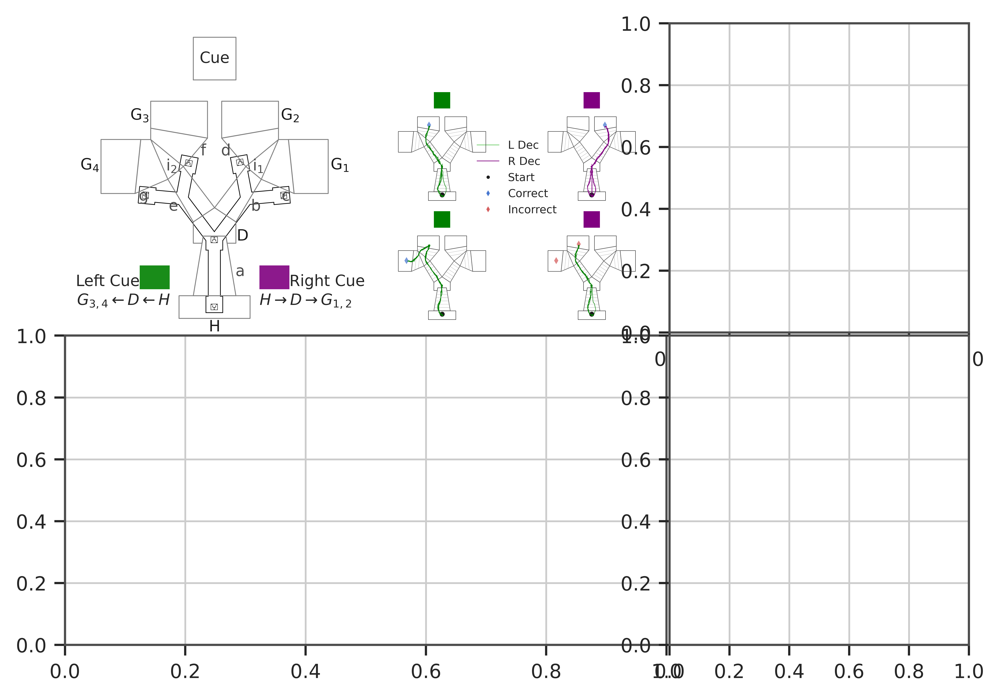

In [71]:
f = plt.figure(constrained_layout=False, figsize=(6,4), dpi=1000)
g = f.add_gridspec(nrows=2, ncols=3, left=0, right=0.95, wspace=0.01, hspace=0.01)

f_ax = np.zeros(5, dtype=object)
f_ax[0] = f.add_subplot(g[0,0])
f_ax[1] = f.add_subplot(g[0,1])
f_ax[2] = f.add_subplot(g[1,0:2])
f_ax[3] = f.add_subplot(g[0,2])
f_ax[4] = f.add_subplot(g[1,2])

p = pf.Fig1()
p.panel_a(ax=f_ax[0])
p.panel_b(ax=f_ax[1])
#f

In [64]:
p0 = f.get_axes()[0].get_position()
x0, y0, w0, h0 = p0.x0, p0.y0, p0.width, p0.height
print(x0,y0,w0,h0)

p5 = f.get_axes()[5].get_position()
x5, y5, w5, h5 = p5.x0, p5.y0, p5.width, p5.height
print(x5,y5,w5,h5)

0.0 0.5043781094527362 0.31456953642384106 0.3756218905472638
0.07656934423348924 0.5232835820895522 0.16061905560480105 0.25016417910447764


In [72]:
p0 = f.get_axes()[0].get_position()
x0, y0, w0, h0 = p0.x0, p0.y0, p0.width, p0.height
print(x0,y0,w0,h0)

p5 = f.get_axes()[5].get_position()
x5, y5, w5, h5 = p5.x0, p5.y0, p5.width, p5.height
print(x5,y5,w5,h5)

0.0 0.49243781094527356 0.31456953642384106 0.4875621890547264
0.07656934423348924 0.5232835820895522 0.16061905560480105 0.25016417910447764


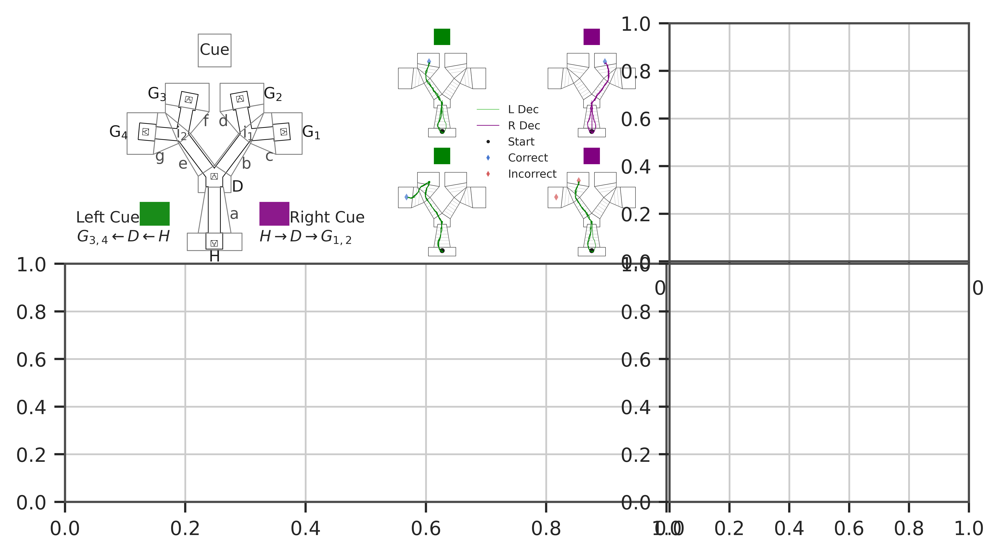

<Figure size 432x288 with 0 Axes>

In [65]:
p.panel_b(ax=f_ax[1])
f

In [66]:
p0 = f.get_axes()[0].get_position()
x0, y0, w0, h0 = p0.x0, p0.y0, p0.width, p0.height
print(x0,y0,w0,h0)

p5 = f.get_axes()[5].get_position()
x5, y5, w5, h5 = p5.x0, p5.y0, p5.width, p5.height
print(x5,y5,w5,h5)

0.0 0.5043781094527362 0.31456953642384106 0.3756218905472638
0.07656934423348924 0.5232835820895522 0.16061905560480105 0.25016417910447764


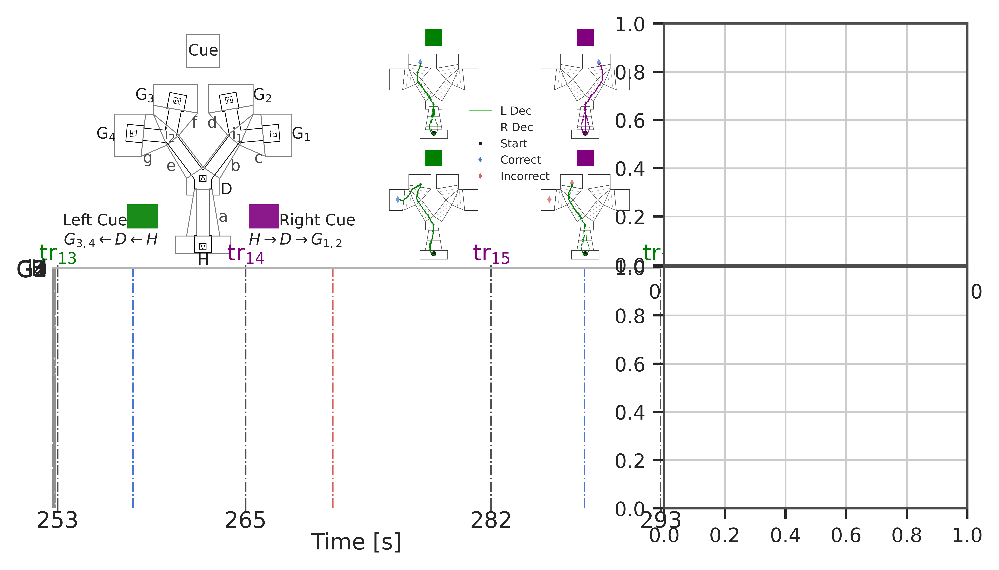

In [67]:
p.panel_c(ax=f_ax[2])
f

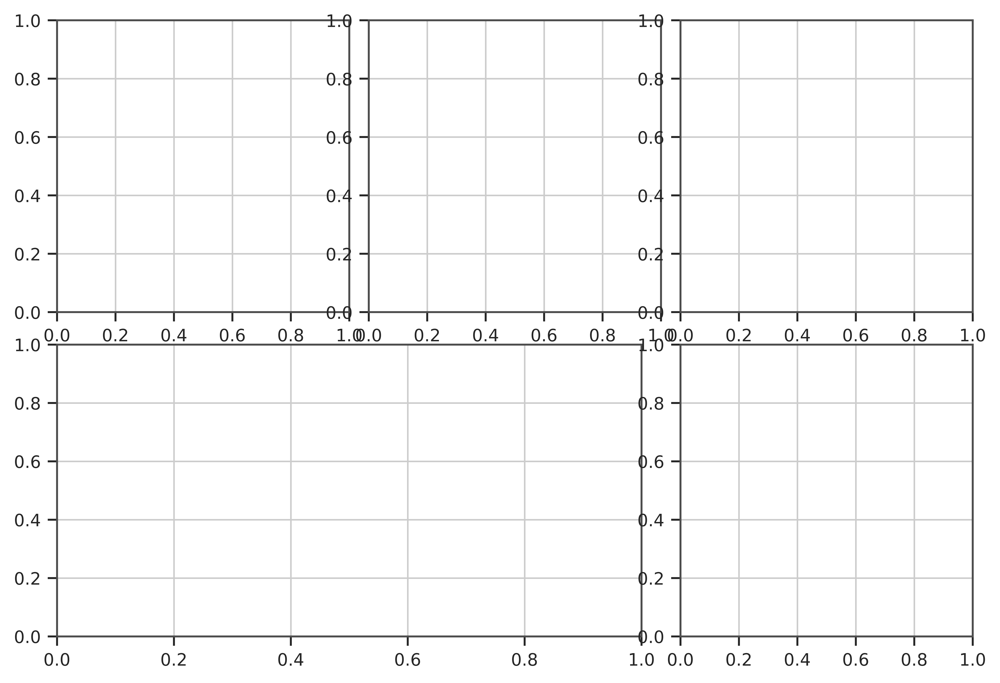

In [75]:
pf = reload(pf)

f1 = pf.Fig1()
f1.fig_layout()

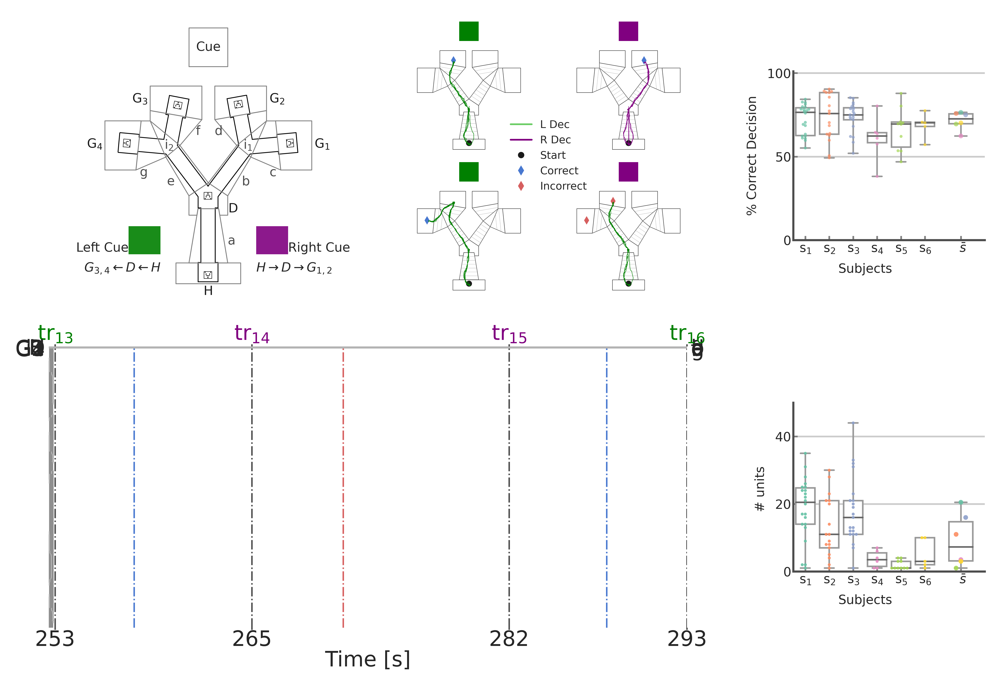

In [95]:
pf = reload(pf)
f1 = pf.Fig1()
_ = f1.plot_all()


(<Figure size 1000x500 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f40de68ceb8>)

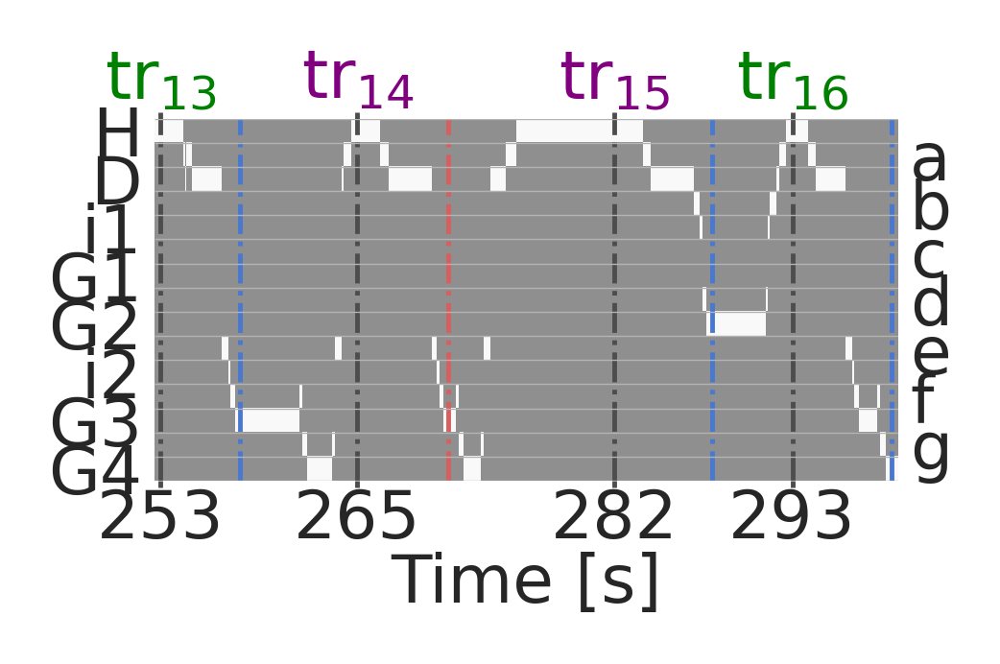

In [ ]:
import Analyses.tree_maze_functions as tmf
tmf = reload(tmf)
tree_maze = tmf.TreeMazeZones()

pos_zones_mat = f1.session_pos_zones_mat

tree_maze.plot_zone_ts_window(pos_zones_mat, trial_table=f1.session_behav.trial_table,
                                           t=f1.session_track_data.t.values - f1.session_track_data.t[0],
                                           trial_nums=f1.params['panel_c']['trial_nums'], samp_buffer=f1.params['panel_c']['samp_buffer'],
                                           h_lw=f1.params['panel_c']['h_lw'], v_lw=f1.params['panel_c']['v_lw'])



# related figures

In [8]:
%load_ext autoreload
%matplotlib inline
from TreeMazeAnalyses2.Analyses import experiment_info as ei
from importlib import reload
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
info = ei.SummaryInfo()
p = info.get_behav_perf(overwrite=True)

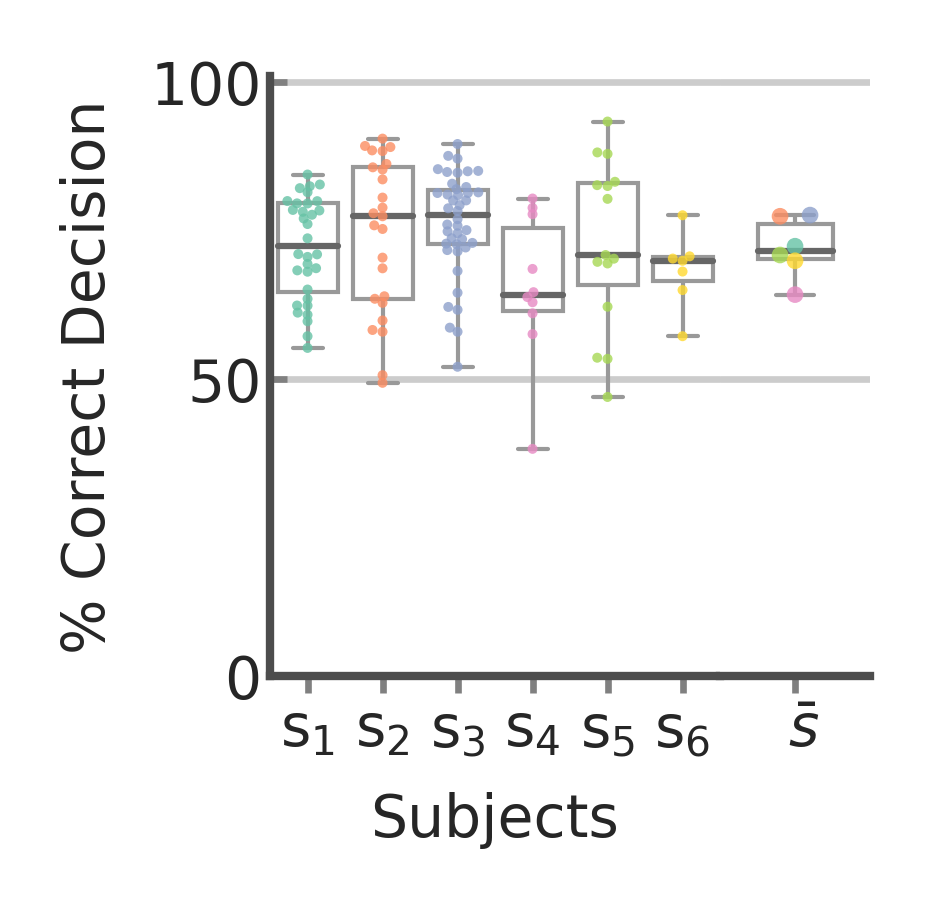

In [29]:
dpi=500
perf = p
min_n_units = 1
min_n_trials = 50
fontsize=7
marker_size=1.2

measure  = 'pct_correct'

subset = perf[(perf.n_units>=min_n_units) & (perf.n_trials>=min_n_trials)]
subjects = subset.subject.unique()

f,ax = plt.subplots(figsize=(1,1), dpi=600)

x_split = 0.75
ax.set_position([0,0,x_split,1])

sns.set_theme(context='paper', style="whitegrid", font_scale=0.75, palette="Set2")
sns.set_style(rc={"axes.edgecolor":'0.3',
                 'xtick.bottom': True,
                 'ytick.left': True})

sns.boxplot(x='subject', y=measure, data=subset, color='w', linewidth=0.5, whis=100,  ax=ax)
sns.swarmplot(x='subject', y=measure,data=subset, size=marker_size, ax=ax, **{'alpha':0.8}) 

for line in ax.get_lines()[4::len(subjects)]:
    line.set(**{'color':'0.4', 
               'lw':0.75})
    
ax.set_ylim(0,1.01)
ax.set_yticks([0,0.5,1])
ax.set_yticklabels([0, 50, 100], fontsize=fontsize)

if measure  ==  'pct_correct':
    ax.set_ylabel('% Correct Decision',fontsize=fontsize)
elif measure == 'pct_sw_correct':
    ax.set_ylabel('% Correct Switch',fontsize=fontsize)

ax.set_xticklabels([f"s$_{{{ii}}}$" for ii in range(1,len(subjects)+1)], fontsize=fontsize)
ax.set_xlabel('Subjects',fontsize=fontsize)

for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)

ax.tick_params(axis="y", direction="in", length=2, width=0.8, color="0.5",  which='major', pad=1)
ax.tick_params(axis="x", direction="out", length=2, width=0.8, color="0.5",  which='major', pad=1)


# summary
ax = f.add_axes([x_split,0,1-x_split,1])

subset2 = subset.groupby('subject').median()

colors =  plt.rcParams['axes.prop_cycle'].by_key()['color']
subset2['color'] = 0

for ii, s in enumerate(subjects):
    subset2.loc[s, 'color'] = mpl.colors.to_hex(colors[ii])
    

sns.boxplot(y=measure, data=subset2.loc[subjects], color='w', linewidth=0.5, whis=100, width=0.5, ax=ax)

x_locs = np.array([0,-1,1, 0,-1, 0])*0.1
ax.scatter(x_locs, subset2.loc[subjects, measure], s=4, c=subset2.loc[subjects,'color'], alpha=0.8, lw=0, zorder=10) 


for line in ax.get_lines()[4::len(subjects)]:
    line.set(**{'color':'0.4', 
               'lw':0.75})

ax.set_ylim(0,1.01)
ax.set_yticks([0,0.5,1])
ax.set_yticklabels('')
ax.set_ylabel('')

ax.set_xticklabels( [r" $\bar s$ "], fontsize=fontsize)

for spine in ['top', 'right', 'left']:
    ax.spines[spine].set_visible(False)

    
ax.tick_params(axis="y", direction="in", length=2, width=0.8, color="0.5",  which='major', pad=1)
ax.tick_params(axis="x", direction="out", length=2, width=0.8, color="0.5",  which='major', pad=1)

ax.tick_params(axis='y', left=False) 

f.savefig(info.paths['figures'] / f"subjects_{measure}.jpeg", bbox_inches='tight', dpi=dpi)

/home/alexgonzalez/anaconda3/envs/tm_analyses/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 26.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


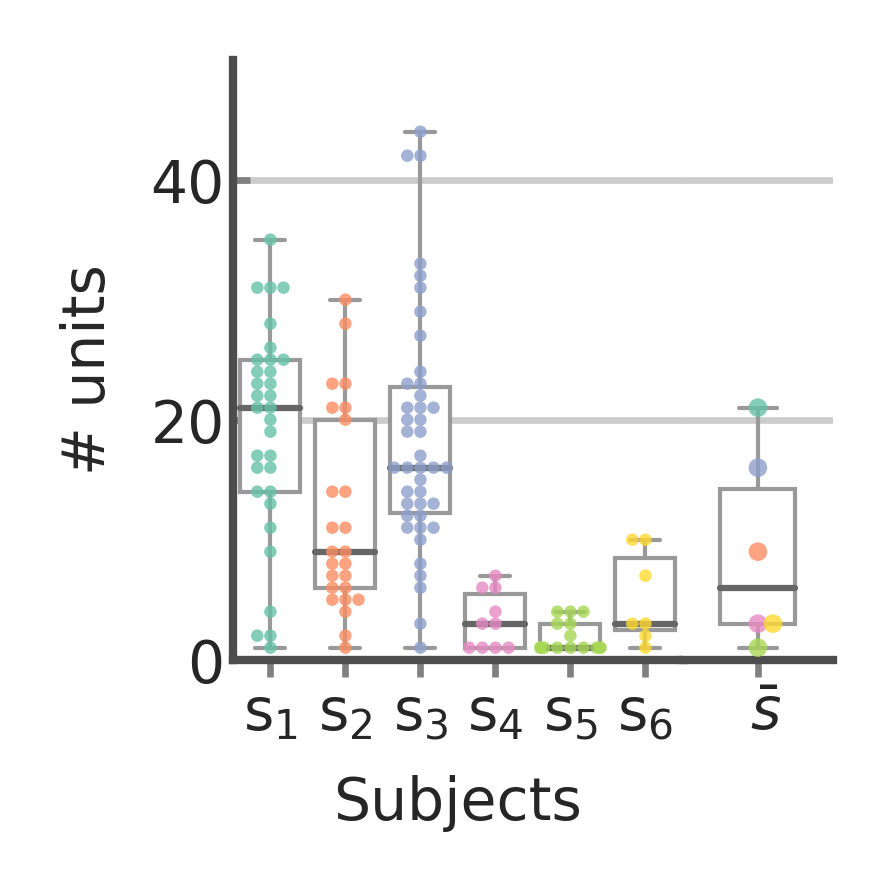

In [30]:

measure = 'n_units'

f,ax = plt.subplots(figsize=(1,1), dpi=600)

if 'cells' in measure:
    subset = perf[(perf.n_cells>=min_n_units) & (perf.n_trials>=min_n_trials)]
else:
    subset = perf[(perf.n_units>=min_n_units) & (perf.n_trials>=min_n_trials)]


x_split = 0.75
ax.set_position([0,0,x_split,1])

sns.set_theme(context='paper', style="whitegrid", font_scale=0.75, palette="Set2")
sns.set_style(rc={"axes.edgecolor":'0.3',
                 'xtick.bottom': True,
                 'ytick.left': True})


sns.boxplot(x='subject', y=measure, data=subset, color='w', linewidth=0.5, whis=100,  ax=ax)
sns.swarmplot(x='subject', y=measure,data=subset, size=1.5, ax=ax, **{'alpha':0.8}) 

for line in ax.get_lines()[4::len(subjects)]:
    line.set(**{'color':'0.4', 
               'lw':0.75})
    
ax.set_ylim(0,50)
ax.set_yticks([0,20,40])
ax.set_yticklabels([0, 20, 40], fontsize=fontsize)
ax.set_ylabel('# units ',fontsize=fontsize)

ax.set_xticklabels([f"s$_{{{ii}}}$" for ii in range(1,len(subjects)+1)], fontsize=fontsize)
ax.set_xlabel('Subjects',fontsize=fontsize)

for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)

ax.tick_params(axis="y", direction="in", length=2, width=0.8, color="0.5",  which='major', pad=1)
ax.tick_params(axis="x", direction="out", length=2, width=0.8, color="0.5",  which='major', pad=1)

# summary
ax = f.add_axes([x_split,0,1-x_split,1])

subset2 = subset.groupby('subject').median()

colors =  plt.rcParams['axes.prop_cycle'].by_key()['color']
subset2['color'] = 0

for ii, s in enumerate(subjects):
    subset2.loc[s, 'color'] = mpl.colors.to_hex(colors[ii])
    

sns.boxplot(y=measure, data=subset2.loc[subjects], color='w', linewidth=0.5, whis=100, width=0.5, ax=ax)

x_locs = np.array([0,0,0, 0,0, 1])*0.1
ax.scatter(x_locs, subset2.loc[subjects, measure], s=5,c=subset2.loc[subjects,'color'], alpha=0.8, lw=0, zorder=10) 


for line in ax.get_lines()[4::len(subjects)]:
    line.set(**{'color':'0.4', 
               'lw':0.75})

ax.set_ylim(0,50)
ax.set_yticks([0,20,40])
ax.set_yticklabels('')
ax.set_ylabel('')

ax.set_xticklabels( [r" $\bar s$ "], fontsize=fontsize)

for spine in ['top', 'right', 'left']:
    ax.spines[spine].set_visible(False)

    
ax.tick_params(axis="y", direction="in", length=2, width=0.8, color="0.5",  which='major', pad=1)
ax.tick_params(axis="x", direction="out", length=2, width=0.8, color="0.5",  which='major', pad=1)
ax.tick_params(axis='y', left=False) 
f.savefig(info.paths['figures'] / f"subjects_{measure}.jpeg", bbox_inches='tight', dpi=dpi)

In [33]:
subset.groupby('subject').sum().sum()

n_trials           19165.000000
n_sw_trials         9294.000000
n_vsw_trials        7059.000000
n_L_trials          9777.000000
n_R_trials          9388.000000
pct_correct           95.800678
pct_sw_correct       100.826082
pct_vsw_correct      105.821188
pct_L_correct         96.298578
pct_R_correct         95.451744
n_units             1792.000000
n_cells              518.000000
n_mua               1274.000000
dtype: float64